### Modelling and more plots for predicting daily average fare amounts

In [10]:
import os
import sys
sys.path.append("../")
import pandas as pd
from pyspark.sql import SparkSession
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder
from scripts.yellow_green_taxi_scrape import get_taxi_data_future, preprocess_future_taxi_data
from scripts.weather_scrape import preprocess_future_weather_data
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# create a spark session (which will run spark jobs)
spark = (
    SparkSession.builder.appName("Model Data")
    .config("spark.sql.repl.eagerEval.enabled", True) 
    .config("spark.sql.parquet.cacheMetadata", "true")
    .config("spark.sql.session.timeZone", "Etc/UTC")
    .getOrCreate()
)

In [11]:
get_taxi_data_future()
preprocess_future_taxi_data()
preprocess_future_weather_data()

Begin 04/2023 for yellow_taxi
Completed 04/2023 for yellow_taxi
Begin 05/2023 for yellow_taxi
Completed 05/2023 for yellow_taxi
Begin 06/2023 for yellow_taxi
Completed 06/2023 for yellow_taxi
Begin 04/2023 for green_taxi
Completed 04/2023 for green_taxi
Begin 05/2023 for green_taxi
Completed 05/2023 for green_taxi
Begin 06/2023 for green_taxi
Completed 06/2023 for green_taxi


24/08/25 15:24:50 WARN SparkSession: Using an existing Spark session; only runtime SQL configurations will take effect.
24/08/25 15:29:13 WARN SparkStringUtils: Truncated the string representation of a plan since it was too large. This behavior can be adjusted by setting 'spark.sql.debug.maxToStringFields'.
24/08/25 15:29:32 WARN SparkSession: Using an existing Spark session; only runtime SQL configurations will take effect.


In [12]:
import_path = '../data/curated/'

# Read the Parquet file into a DataFrame
taxi_data = spark.read.parquet(f'{import_path}cleaned_taxi_data.parquet')
taxi_averages = spark.read.parquet(f'{import_path}taxi_averages_data.parquet')
future_taxi_data = spark.read.parquet(f'{import_path}cleaned_future_taxi_data.parquet')
future_taxi_averages = spark.read.parquet(f'{import_path}future_taxi_averages_data.parquet')
weather_data = spark.read.parquet(f'{import_path}weather_data.parquet')
future_weather_data = spark.read.parquet(f'{import_path}future_weather_data.parquet')

Load the data as pandas dataframes for easier integration into modelling algorithms

In [23]:
# Load your data
taxi_averages_pd = taxi_averages.toPandas()
weather_data_pd = weather_data.toPandas()
future_taxi_averages_pd = future_taxi_averages.toPandas()
future_weather_data_pd = future_weather_data.toPandas()

# Merge the taxi data with weather data on the date field
train_data = pd.merge(taxi_averages_pd, weather_data_pd, on='date', how='left')
test_data = pd.merge(future_taxi_averages_pd, future_weather_data_pd, on='date', how='left')

In [14]:
train_data.describe()

,pu_location_id,num_pickups,avg_total_amount,avg_trip_time,avg_fare_amount,avg_passenger_count,avg_trip_distance,avg_extra,avg_mta_tax,avg_tip_amount,...,daily_zone_revenue,day_of_week,mean_temperature,mean_dew_point_temperature,mean_station_level_pressure,mean_sea_level_pressure,mean_wind_speed,mean_precipitation,mean_relative_humidity,mean_wet_bulb_temperature
count,28260.000000,28260.000000,28260.000000,28260.000000,28260.000000,28260.000000,28260.000000,28260.000000,28260.000000,28260.000000,...,28260.000000,28260.000000,27943.000000,27943.000000,27943.000000,27943.000000,27943.000000,27943.000000,27943.000000,27943.000000
mean,139.710297,634.556299,29.719785,0.298857,22.384597,1.401001,4.612778,0.946924,0.500000,3.151532,...,15662.927239,4.013907,7.715460,-0.475970,1012.779246,1017.704014,2.527631,0.070003,59.297047,4.451616
std,76.253087,1163.217710,18.573998,0.171103,14.895236,0.475544,3.668754,0.809373,0.000025,3.058781,...,37167.204106,1.999553,5.787127,7.475772,7.610285,7.651747,0.990176,0.156211,15.471096,5.681483
min,1.000000,1.000000,3.300000,0.020556,2.500000,1.000000,0.010000,0.000000,0.495833,0.000000,...,3.300000,1.000000,-12.138095,-23.765217,992.055556,996.900000,0.472727,0.000000,27.391304,-13.752381
25%,74.000000,2.000000,18.706825,0.210032,13.099823,1.000000,2.379478,0.416667,0.500000,1.528625,...,61.500000,2.000000,3.820833,-5.652174,1008.108696,1012.986957,1.786364,0.000000,48.636364,0.828571
50%,142.000000,15.000000,23.171953,0.255134,16.500000,1.350000,3.255274,0.902866,0.500000,2.605789,...,504.215000,4.000000,7.158333,-1.272727,1013.709091,1018.600000,2.433333,0.000000,57.166667,3.733333
75%,209.000000,730.000000,32.800000,0.336667,25.672500,1.500000,5.240000,1.251558,0.500000,3.536835,...,17034.152500,6.000000,11.404348,4.591304,1018.317391,1023.260870,3.122727,0.056522,70.708333,8.614286
max,265.000000,7639.000000,127.200000,4.606389,105.900000,6.000000,51.950000,7.500000,0.500000,22.770000,...,492751.610000,7.000000,21.847826,17.145833,1031.716667,1036.758333,5.766667,1.147826,93.409091,18.182609


Further preprocessing to set up for machine learning. Define date as an integer and encode pick-up location using one hot encoding, remove all null values.

In [24]:
def encoded_df(df):
    # make date numerical int type 
    df['date'] = pd.to_datetime(df['date']).astype(int) / 10**9

    # Encode the pu_location_id as it is categorical
    encoder = OneHotEncoder(sparse_output=False, drop='first')
    encoded_pu_location_id = encoder.fit_transform(df[['pu_location_id']].astype(int))
    encoded_df = pd.DataFrame(encoded_pu_location_id, columns=encoder.get_feature_names_out(['pu_location_id']))
    df = pd.concat([df.drop('pu_location_id', axis=1), encoded_df], axis=1)
    return df

train_data = encoded_df(train_data)
test_data = encoded_df(test_data)

def fill_columns(train_df, test_df):
    # Get the list of columns for each DataFrame
    train_columns = set(train_df.columns)
    test_columns = set(test_df.columns)

    # Determine all unique columns across both DataFrames
    all_columns = sorted(train_columns.union(test_columns))

    # Reindex both DataFrames to include all columns, filling missing ones with 0
    train_df = train_df.reindex(columns=all_columns, fill_value=0)
    test_df = test_df.reindex(columns=all_columns, fill_value=0)

    return train_df, test_df

train_data, test_data = fill_columns(train_data, test_data)

train_data_encoded = train_data.dropna()
test_data_encoded = test_data.dropna()

Initial look at a pairplot of all numeric features

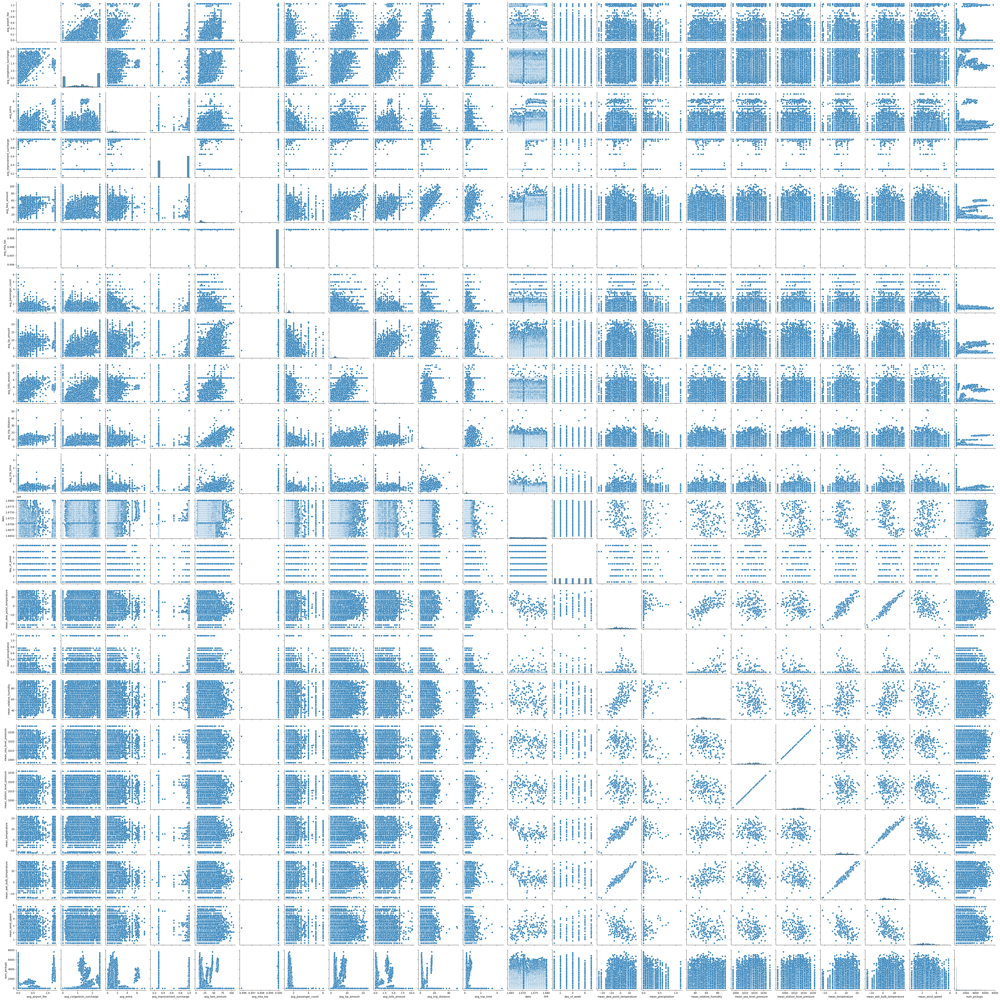

In [37]:
import seaborn as sns
# Select relevant columns
cols_to_plot = ['avg_airport_fee', 'avg_congestion_surcharge', 'avg_extra', 'avg_improvement_surcharge', 'avg_fare_amount',
                'avg_mta_tax', 'avg_passenger_count', 'avg_tip_amount', 'avg_tolls_amount', 'avg_trip_distance', 
                'avg_trip_time', 'date', 'day_of_week', 'mean_dew_point_temperature', 'mean_precipitation', 
                'mean_relative_humidity', 'mean_sea_level_pressure', 'mean_station_level_pressure', 
                'mean_temperature', 'mean_wet_bulb_temperature', 'mean_wind_speed', 'num_pickups']

# Create the pairplot
sns.pairplot(train_data[cols_to_plot], kind='scatter')

plt.savefig('../plots/pairplot.png')

# Too big to show

Looking at the distributions of the numeric values to try make the errors of the residuals approximately multivariate normal to coincide with the assumptions of a linear model

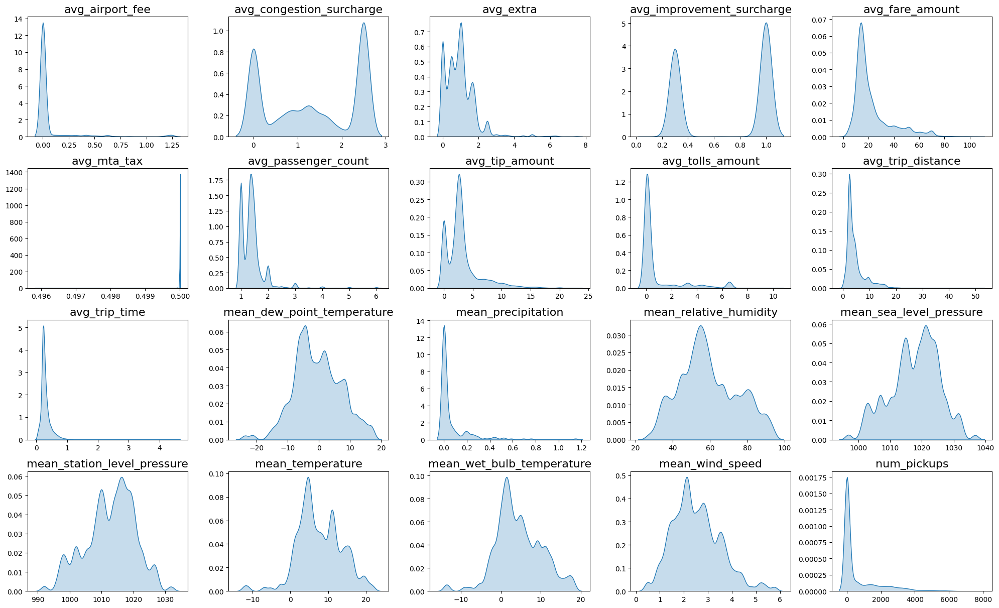

In [30]:
numerical_columns =  ['avg_airport_fee', 'avg_congestion_surcharge', 'avg_extra', 'avg_improvement_surcharge', 'avg_fare_amount',
                'avg_mta_tax', 'avg_passenger_count', 'avg_tip_amount', 'avg_tolls_amount', 'avg_trip_distance', 
                'avg_trip_time', 'mean_dew_point_temperature', 'mean_precipitation', 
                'mean_relative_humidity', 'mean_sea_level_pressure', 'mean_station_level_pressure', 
                'mean_temperature', 'mean_wet_bulb_temperature', 'mean_wind_speed', 'num_pickups']

# Set up the matplotlib figure
plt.figure(figsize=(20, 15))

# Create subplots
for i, numerical_column in enumerate(numerical_columns, 1):
    plt.subplot(5, 5, i)
    sns.kdeplot(train_data_encoded[numerical_column], fill=True)
    plt.title(numerical_column, fontsize = 16)
    plt.xlabel('', fontsize=14)  # Set x-axis label font size
    plt.ylabel('', fontsize=14)  # Set y-axis label font size
    plt.tight_layout()

plt.savefig("../plots/density_plots.png")
plt.show()

Columns to be logged

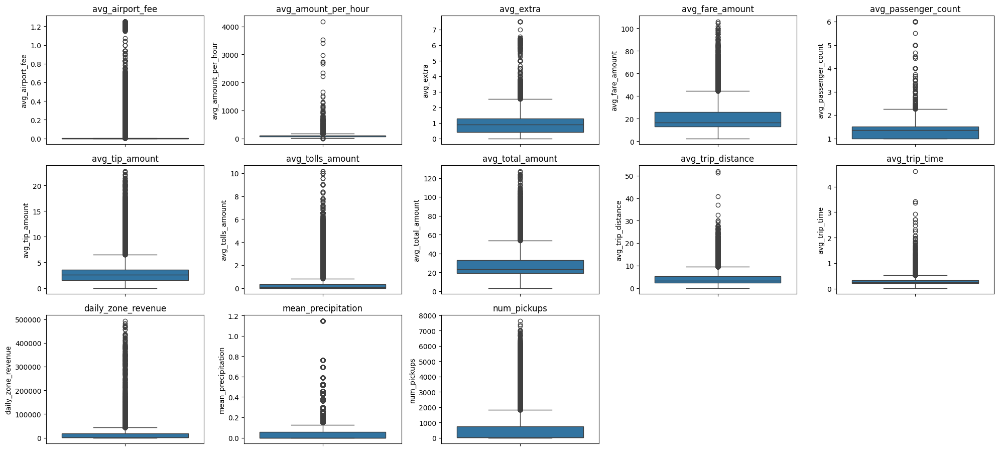

In [18]:
columns = [
    'avg_airport_fee', 'avg_amount_per_hour',
    'avg_extra', 'avg_fare_amount', 'avg_passenger_count', 'avg_tip_amount',
    'avg_tolls_amount', 'avg_total_amount', 'avg_trip_distance',
    'avg_trip_time', 'daily_zone_revenue',
    'mean_precipitation', 'num_pickups'
]

# Set up the matplotlib figure
plt.figure(figsize=(20, 15))

# Create subplots
for i, numerical_columns in enumerate(columns, 1):
    plt.subplot(5, 5, i)
    sns.boxplot(y=train_data_encoded[numerical_columns])
    plt.title(numerical_columns)
    plt.tight_layout()

plt.savefig("../plots/boxplots")
plt.show()

Log all the values that are not normally distributed

In [19]:
to_log = [
    'avg_airport_fee', 'avg_amount_per_hour',
    'avg_extra', 'avg_fare_amount', 'avg_passenger_count', 'avg_tip_amount',
    'avg_tolls_amount', 'avg_total_amount', 'avg_trip_distance',
    'avg_trip_time', 'daily_zone_revenue',
    'mean_precipitation', 'num_pickups'
]

for feature_ranking in [train_data_encoded, test_data_encoded]:
    # Apply log transformation
    for numerical_columns in to_log:
        feature_ranking.loc[:, numerical_columns] = np.log(feature_ranking[numerical_columns] + 1)

/tmp/ipykernel_7688/1649677427.py:12: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[7.50769008 3.33220451 1.60943791 ... 7.30182234 0.69314718 3.63758616]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  feature_ranking.loc[:, numerical_columns] = np.log(feature_ranking[numerical_columns] + 1)
/tmp/ipykernel_7688/1649677427.py:12: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.69314718 7.76472054 2.99573227 ... 2.39789527 0.69314718 7.25347038]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  feature_ranking.loc[:, numerical_columns] = np.log(feature_ranking[numerical_columns] + 1)


Prepare the training and test sets

In [20]:
X_train = train_data_encoded.drop(['avg_total_amount', 'avg_amount_per_hour', 'avg_fare_amount', 'daily_zone_revenue', 'avg_trip_distance', 'avg_trip_time'], axis = 1)
y_train = train_data_encoded['avg_fare_amount']
X_test = test_data_encoded.drop(['avg_total_amount', 'avg_amount_per_hour', 'avg_fare_amount', 'daily_zone_revenue', 'avg_trip_distance', 'avg_trip_time'], axis = 1)
y_test = test_data_encoded['avg_fare_amount']

Linear Regression (LR)


In [31]:
# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create DataFrames for scaled features
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# Initialize linear regression model
model = LinearRegression()

# List to store results
results = []
selected_features_dict = {}

# Search for the best number of features
for num_features in range(141, 143):   
    # Initialize RFE with the current number of features to select
    rfe = RFE(model, n_features_to_select=num_features)
    rfe.fit(X_train_scaled_df, y_train)

    # Get the mask of selected features
    selected_features = X_train_scaled_df.columns[rfe.support_]

    # Store the selected features for current num_features
    selected_features_dict[num_features] = selected_features.tolist()
    
    # Transform the data to keep only selected features
    X_train_selected = X_train_scaled_df[selected_features]
    X_test_selected = X_test_scaled_df[selected_features]

    # Train the model
    model.fit(X_train_selected, y_train)

    # Predict and evaluate
    y_pred = model.predict(X_test_selected)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Store results
    results.append({
        'num_features': num_features,
        'mean_squared_error': mse,
        'r2_score': r2
    })

In [32]:
# Convert results to a DataFrame for easier analysis
results_df = pd.DataFrame(results)

# Print the results
print("Results:")
print(results_df)

# Find the best number of features based on R^2 score
best_num_features = results_df.loc[results_df['r2_score'].idxmax()]['num_features']
print(f"Best number of features: {best_num_features}")

Results:
   num_features  mean_squared_error  r2_score
0           141            0.049717  0.818941
1           142            0.049703  0.818989
Best number of features: 142.0


From above we found optimal amount of features here we will look at properties of the feature selection without running it again

In [33]:
# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create DataFrames for scaled features
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# Initialize linear regression model
model = LinearRegression()

# List to store results
results = []
selected_features_dict = {}

# Initialize RFE with the current number of features to select
rfe = RFE(model, n_features_to_select=142)
rfe.fit(X_train_scaled_df, y_train)

# Get the mask of selected features
selected_features = X_train_scaled_df.columns[rfe.support_]

# Get feature rankings
feature_ranking = pd.DataFrame({
    'Feature': X_train_scaled_df.columns,
    'Ranking': rfe.ranking_
})

# Sort by ranking
feature_ranking = feature_ranking.sort_values(by='Ranking')

# Display feature rankings
print("Feature Ranking:")
print(feature_ranking)

# Store the selected features for current num_features
selected_features_dict[142] = selected_features.tolist()

# Transform the data to keep only selected features
X_train_selected = X_train_scaled_df[selected_features]
X_test_selected = X_test_scaled_df[selected_features]

# Train the model
model.fit(X_train_selected, y_train)

# Predict and evaluate
y_pred = model.predict(X_test_selected)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Store results
results.append({
    'num_features': 142,
    'mean_squared_error': mse,
    'r2_score': r2
})

# Convert results to a DataFrame for easier analysis
results_df = pd.DataFrame(results)

# Print the results
print("Results:")
print(results_df)

# Find the best number of features based on R^2 score
best_num_features = results_df.loc[results_df['r2_score'].idxmax()]['num_features']
print(f"Best number of features: {best_num_features}")

Feature Ranking:
                Feature  Ranking
0       avg_airport_fee        1
125  pu_location_id_199        1
128  pu_location_id_200        1
130  pu_location_id_202        1
131  pu_location_id_203        1
..                  ...      ...
96   pu_location_id_172      133
233   pu_location_id_58      134
134  pu_location_id_206      135
83   pu_location_id_160      136
117  pu_location_id_191      137

[278 rows x 2 columns]
Results:
   num_features  mean_squared_error  r2_score
0           142            0.049703  0.818989
Best number of features: 142.0


Geospatial analysis of the ranking of the pick-up location data

In [ ]:
import pandas as pd
import geopandas as gpd
import folium
from branca.colormap import linear

# Load and prepare the feature ranking DataFrame
# Assuming feature_ranking is already defined
location_ranks = feature_ranking[feature_ranking['Feature'].str.contains('pu_location_id')]
location_ranks['pu_location_id'] = location_ranks['Feature'].str.extract('(\d+)').astype(int)
location_ranks = location_ranks[['pu_location_id', 'Ranking']]

# Read shapefile and zone lookup CSV
sf = gpd.read_file("../data/raw/taxi_zones/taxi_zones.shp")
zones = pd.read_csv("../data/raw/taxi_zones/taxi+_zone_lookup.csv")

# Check if CRS transformation is needed
print(sf.crs)  # Check current CRS
if sf.crs != 'EPSG:4326':  # Check if it's not already in WGS84
    sf = sf.to_crs(epsg=4326)

# Merge the GeoJSON data with the ranking DataFrame
gdf = pd.merge(zones, sf, left_on='LocationID', right_on='LocationID', how='inner')
gdf = gdf.merge(location_ranks[['pu_location_id', 'Ranking']], left_on='LocationID', right_on='pu_location_id', how='left')
gdf['Ranking'] = gdf['Ranking'].fillna(0)  # Handle any missing values

# Convert to GeoDataFrame
gdf = gpd.GeoDataFrame(gdf, geometry='geometry')

# Create GeoJSON
geoJSON = gdf[['LocationID', 'geometry', 'Ranking']].drop_duplicates('LocationID').to_json()

# Initialize the map
_map = folium.Map(location=[40.7128, -74.0060], 
                  tiles="cartodb positron",
                  zoom_start=10,
                  zoom_control=False,
                  width=700,
                  height=700,
                  html='<div style="font-size: 10pt"></div>')

# Create a colormap
colormap = linear.RdYlBu_10.scale(
    location_ranks['Ranking'].max(),
    location_ranks['Ranking'].min()
)

# Add Choropleth layer to the map with its own legend
folium.Choropleth(
    geo_data=geoJSON,
    name='choropleth',
    data=gdf,
    columns=['LocationID', 'Ranking'],
    key_on='feature.properties.LocationID',
    fill_color='RdYlBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Ranking'
).add_to(_map)

# Save the map to an HTML file and display
_map.save('../plots/foliumChoroplethMap.html')
_map

/tmp/ipykernel_29138/1474946578.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  location_ranks['pu_location_id'] = location_ranks['Feature'].str.extract('(\d+)').astype(int)


EPSG:2263


In [ ]:
# Access coefficients
coefficients = model.coef_
feature_names = X_train.columns

# Print results
print("Mean Squared Error:", mse)
print("R^2 Score:", r2)

features = dict(zip(feature_names, coefficients))
# Sort features by the magnitude of coefficients in descending order
sorted_features = sorted(features.items(), key=lambda x: abs(x[1]), reverse=True)

# Display sorted coefficients
for feature, coef in sorted_features:
    print(f"Feature: {feature}, Coefficient: {coef}")

# Identify the feature with the highest magnitude coefficient
max_magnitude_feature = sorted_features[0][0]
max_magnitude_coefficient = sorted_features[0][1]

print(f"\nHighest Magnitude Feature: {max_magnitude_feature}, Coefficient: {max_magnitude_coefficient}")

Mean Squared Error: 0.048842475470127086
R^2 Score: 0.8221241239622944
Feature: date, Coefficient: 0.4870966160749827
Feature: day_of_week, Coefficient: -0.4838443460998935
Feature: avg_congestion_surcharge, Coefficient: 0.1939804873302256
Feature: avg_passenger_count, Coefficient: 0.13119999325673942
Feature: avg_mta_tax, Coefficient: 0.1284596255047531
Feature: avg_extra, Coefficient: 0.10997363116790013
Feature: pu_location_id_163, Coefficient: -0.08119010531392873
Feature: pu_location_id_114, Coefficient: -0.07877395069510122
Feature: pu_location_id_162, Coefficient: -0.07850524081241832
Feature: pu_location_id_180, Coefficient: -0.077258088461867
Feature: pu_location_id_165, Coefficient: -0.07690122919576835
Feature: pu_location_id_116, Coefficient: -0.07661208745834049
Feature: pu_location_id_157, Coefficient: -0.07596659169907513
Feature: pu_location_id_115, Coefficient: -0.0757978424677878
Feature: mean_station_level_pressure, Coefficient: -0.07472353472501457
Feature: pu_locat

[('date', 0.4870966160749827),
 ('day_of_week', -0.4838443460998935),
 ('avg_congestion_surcharge', 0.1939804873302256),
 ('avg_passenger_count', 0.13119999325673942),
 ('avg_mta_tax', 0.1284596255047531),
 ('avg_extra', 0.10997363116790013),
 ('pu_location_id_163', -0.08119010531392873),
 ('pu_location_id_114', -0.07877395069510122),
 ('pu_location_id_162', -0.07850524081241832),
 ('pu_location_id_180', -0.077258088461867),
 ('pu_location_id_165', -0.07690122919576835),
 ('pu_location_id_116', -0.07661208745834049),
 ('pu_location_id_157', -0.07596659169907513),
 ('pu_location_id_115', -0.0757978424677878),
 ('mean_station_level_pressure', -0.07472353472501457),
 ('pu_location_id_18', -0.07467941466013066),
 ('pu_location_id_161', -0.07438908620253452),
 ('pu_location_id_109', -0.07420102312569588),
 ('pu_location_id_211', -0.07393197176683763),
 ('pu_location_id_133', -0.07301112441858712),
 ('pu_location_id_164', -0.07295636168449596),
 ('pu_location_id_127', -0.07241497276070014),


Looking at the distribution of errors

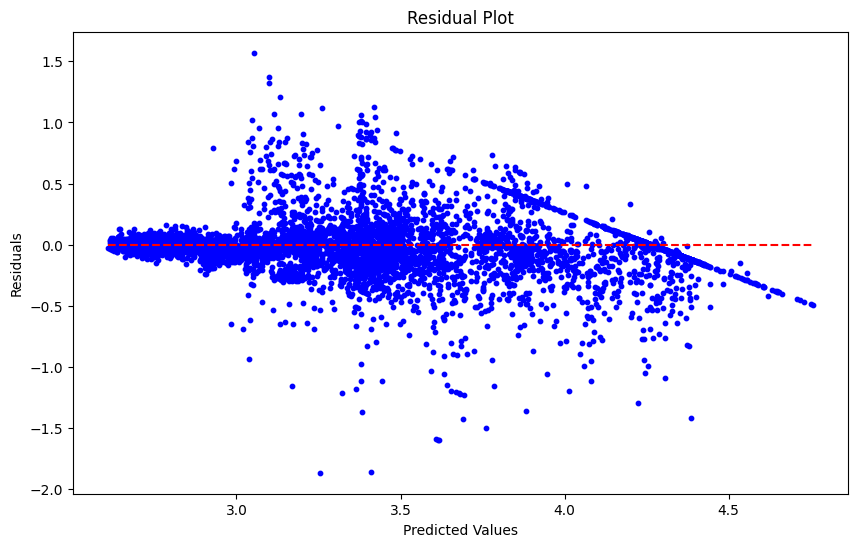

<Figure size 640x480 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
residuals = y_test - y_pred

# Plot residuals
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, color="blue", s=10)
plt.hlines(y=0, xmin=min(y_pred), xmax=max(y_pred), color="red", linestyles="dashed")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residual Plot")
plt.show()
plt.savefig('../plots/residual plot')

Neural Network (NN)

In [34]:
# Search for the best number of features
for num_features in range(128, 131):
    print(num_features)
    # Ensure num_features is an integer
    num_features_int = int(num_features)
    
    # Initialize RFE with the current number of features to select
    rfe = RFE(model, n_features_to_select=num_features_int)
    rfe.fit(X_train_scaled_df, y_train)

    # Get the mask of selected features
    selected_features = X_train_scaled_df.columns[rfe.support_]

    # Store the selected features for current num_features
    selected_features_dict[num_features] = selected_features.tolist()

    # Transform the data to keep only selected features
    X_train_selected = X_train_scaled_df[selected_features]
    X_test_selected = X_test_scaled_df[selected_features]

    # Train the model
    # Define a Neural Network model
    nn_model = Sequential()
    nn_model.add(Dense(units=64, activation='relu', input_shape=(X_train_selected.shape[1],)))
    nn_model.add(Dense(units=32, activation='relu'))
    nn_model.add(Dense(units=1))  # Output layer with one unit for regression

    # Compile the model
    nn_model.compile(optimizer='adam', loss='mean_squared_error')

    # Train the model
    nn_model.fit(X_train_selected, y_train, epochs=10, batch_size=32, verbose=1)

    # Predict and evaluate
    y_pred = nn_model.predict(X_test_selected).flatten()
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Store results
    results.append({
        'num_features': num_features,
        'mean_squared_error': mse,
        'r2_score': r2
    })

128


/home/xplcookie/.local/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step - loss: 0.8327
Epoch 2/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.1141
Epoch 3/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.1050
Epoch 4/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1020
Epoch 5/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0984
Epoch 6/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1003
Epoch 7/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1014
Epoch 8/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0963
Epoch 9/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0970
Epoch 10/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0986
216/216 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
129
Epoch 1/10


/home/xplcookie/.local/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


874/874 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.8157
Epoch 2/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1087
Epoch 3/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.1059
Epoch 4/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1007
Epoch 5/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1045
Epoch 6/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0995
Epoch 7/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0962
Epoch 8/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0962
Epoch 9/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0981
Epoch 10/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0986
216/216 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
130
Epoch 1/10


/home/xplcookie/.local/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


874/874 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.8359
Epoch 2/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1117
Epoch 3/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1073
Epoch 4/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1034
Epoch 5/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1014
Epoch 6/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1015
Epoch 7/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1008
Epoch 8/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0981
Epoch 9/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0995
Epoch 10/10
874/874 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0950
216/216 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


In [ ]:
# Convert results to a DataFrame for easier analysis
results_df = pd.DataFrame(results)

# Print the results
print("Results:")
print(results_df)

# Find the best number of features based on R^2 score
best_num_features = results_df.loc[results_df['r2_score'].idxmax()]['num_features']
print(f"Best number of features: {best_num_features}")


Results:
    num_features  mean_squared_error  r2_score
0            113            0.060094  0.781150
1            110            0.048155  0.824628
2            111            0.047107  0.828444
3            112            0.047286  0.827792
4            113            0.044452  0.838113
5            114            0.046119  0.832044
6            110            0.051390  0.812846
7            111            0.048559  0.823158
8            112            0.048831  0.822167
9            113            0.047475  0.827103
10           114            0.058291  0.787712
11           115            0.045429  0.834557
12           116            0.053715  0.804380
13           117            0.047657  0.826442
14           118            0.046336  0.831251
15           119            0.048538  0.823232
16           120            0.044848  0.836673
17           121            0.053640  0.804653
18           122            0.054114  0.802927
19           123            0.053773  0.804168
20  

[('date', 0.4870966160749827),
 ('day_of_week', -0.4838443460998935),
 ('avg_congestion_surcharge', 0.1939804873302256),
 ('avg_passenger_count', 0.13119999325673942),
 ('avg_mta_tax', 0.1284596255047531),
 ('avg_extra', 0.10997363116790013),
 ('pu_location_id_163', -0.08119010531392873),
 ('pu_location_id_114', -0.07877395069510122),
 ('pu_location_id_162', -0.07850524081241832),
 ('pu_location_id_180', -0.077258088461867),
 ('pu_location_id_165', -0.07690122919576835),
 ('pu_location_id_116', -0.07661208745834049),
 ('pu_location_id_157', -0.07596659169907513),
 ('pu_location_id_115', -0.0757978424677878),
 ('mean_station_level_pressure', -0.07472353472501457),
 ('pu_location_id_18', -0.07467941466013066),
 ('pu_location_id_161', -0.07438908620253452),
 ('pu_location_id_109', -0.07420102312569588),
 ('pu_location_id_211', -0.07393197176683763),
 ('pu_location_id_133', -0.07301112441858712),
 ('pu_location_id_164', -0.07295636168449596),
 ('pu_location_id_127', -0.07241497276070014),
